In [88]:
%load_ext autoreload
%autoreload 2
import os
os.chdir("/scratch/ewalt/pdm/rs-uncertainty")
import matplotlib.patches as patches
import matplotlib.pyplot as plt
from src.metrics import StratifiedRCU
from src.viz import ExperimentVisualizer
from pathlib import Path
import rasterio
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
sns.set_style("whitegrid")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
RESDIR = "results/cloud_exp/2023-05-26_15-55-46"
S2DIR = "gee_data/reprojected/"
S2REPRDIR = "gee_data/reprojected_dirs"
GTDIR = "assets/data/preprocessed"

In [3]:
VARIABLES = ['P95', 'MeanH', 'Dens', 'Gini', 'Cover']

In [4]:
# Experiment result directories
result_dirs = [p.path for p in os.scandir(RESDIR) if os.path.exists(os.path.join(p.path,"rcu.json"))]
len(result_dirs)

72

# Sanity check: Alex vs GEE

To validate the GEE preprocessing pipeline, we perform a sanity check by ensuring that the results predictions made on Alex's data and the GEE data at the same timestamp are "close enough". 

In [87]:
SANITYRESDIR = "results/cloud_exp/2023-05-31_11-23-56_sanity_check" # results
SANITYS2DIR = "assets/data/sentinel_data/s2_reprojected" # s2 reprojected
SANITYS2REPRDIR = "gee_data/sanity_check/" # restructured s2 reprojected

In [ ]:
# load matching rcus
# merge dataframes
# show and decide if close enough

# Visual results: four different clouding conditions

In [93]:
dir(slice(0, 10)), slice(0,10).start, slice(0,10).stop

(['__class__',
  '__delattr__',
  '__dir__',
  '__doc__',
  '__eq__',
  '__format__',
  '__ge__',
  '__getattribute__',
  '__gt__',
  '__hash__',
  '__init__',
  '__init_subclass__',
  '__le__',
  '__lt__',
  '__ne__',
  '__new__',
  '__reduce__',
  '__reduce_ex__',
  '__repr__',
  '__setattr__',
  '__sizeof__',
  '__str__',
  '__subclasshook__',
  'indices',
  'start',
  'step',
  'stop'],
 0,
 10)

In [104]:
def clip(arr, bounds):
    bounds = (float(bounds[0]), float(bounds[1]))
    arr = np.where(arr>bounds[1], bounds[1], arr)
    arr = np.where(arr<bounds[0], bounds[0], arr)
    arr -= bounds[0]
    arr /= (bounds[1]-bounds[0])
    return arr

def showRGB(dirs, titles=None, islice=None, jslice=None, draw_bbox=False):
    n = len(dirs)
    fig, axs = plt.subplots(ncols=4, nrows=1, figsize=(12,4))
    axs = axs.flatten()
    i = 0
    for d, ax in zip(dirs, axs):
        dir_name = d.split("/")[-1]
        pid = dir_name.split("_")[0]
        img_path = list(Path(os.path.join(S2REPRDIR, dir_name, pid)).glob("*.tif"))[0]
        title = i if titles is None else titles[i]
        with rasterio.open(img_path) as f:
            rgb = f.read([4,3,2])
            rgb = clip(rgb, (100, 2000))
            rgb = rgb.transpose(1,2,0)
            if islice is not None and jslice is not None: 
                if not draw_bbox:
                    rgb = rgb[islice,jslice]
                    ax.imshow(rgb)
                else:
                    ax.imshow(rgb)
                    ax.add_patch(
                        patches.Rectangle(
                            (jslice.start, islice.start), # top left corner
                            jslice.stop-jslice.start, # positive width
                            islice.stop-islice.start, # positive height
                            linewidth=2,
                            edgecolor="r",
                            fill=False
                        )
                    )
        ax.set_title(title)
        ax.set_axis_off()
        i += 1
    plt.tight_layout()
    plt.show()
    
def showVariableResults(dirs, titles, variable_index, variable_name, islice=None, jslice=None, normalize=False):
    fig, axs = plt.subplots(nrows=len(titles), ncols=6, figsize=(20,12))
    for i, d in enumerate(dirs):
        dir_name = d.split("/")[-1]
        pid = dir_name.split("_")[0]
        img_path = list(Path(os.path.join(S2REPRDIR, dir_name, pid)).glob("*.tif"))[0]
        mean_path = Path(os.path.join(d, f"{pid}_mean.tif"))
        variance_path = Path(os.path.join(d, f"{pid}_variance.tif"))
        gt_path = os.path.join(GTDIR, f"{pid}.tif")
        title = titles[i]
        with rasterio.open(img_path) as f:
            rgb = f.read([4,3,2])
            rgb = clip(rgb, (100, 2000))
            rgb = rgb.transpose(1,2,0)
            if islice is not None: rgb = rgb[islice]
            if jslice is not None: rgb = rgb[:,jslice]
        with rasterio.open(gt_path) as f:
            gt = f.read(variable_index)
            gt_mask = f.read_masks(1)//255
            gt[gt_mask==0]=np.nan
            if islice is not None: gt = gt[islice]
            if jslice is not None: gt = gt[:,jslice]
        with rasterio.open(mean_path) as f:
            mean = f.read(variable_index)
            if islice is not None: mean = mean[islice]
            if jslice is not None: mean = mean[:,jslice]
        with rasterio.open(variance_path) as f:
            variance = f.read(variable_index)
            if islice is not None: variance = variance[islice]
            if jslice is not None: variance = variance[:,jslice]
        if normalize:
            norm2d = lambda x: (x-np.nanmin(x, axis=(0,1)))/(np.nanmax(x, axis=(0,1))-np.nanmin(x, axis=(0,1)))
            rgb = norm2d(rgb)
            gt = norm2d(gt)
            mean = norm2d(mean)
            variance = norm2d(variance)
        axs[i,0].imshow(rgb)
        axs[i,0].set_title(f"{titles[i]} - rgb")
        sns.heatmap(gt, ax=axs[i,1])
        axs[i,1].set_title(f"{titles[i]} - gt")
        # break
        sns.heatmap(mean, ax=axs[i,2])
        axs[i,2].set_title(f"{titles[i]} - mean")
        sns.heatmap(variance, ax=axs[i,3])
        axs[i,3].set_title(f"{titles[i]} - variance")
        sns.heatmap(gt-mean, ax=axs[i,4])
        axs[i,4].set_title(f"{titles[i]} - r-error")
        sns.heatmap(gt-mean-np.sqrt(variance), ax=axs[i,5])
        axs[i,5].set_title(f"{titles[i]} - c-error")
    for ax in axs.flatten(): ax.set_axis_off()
    fig.suptitle(variable_name)
    plt.tight_layout()
    plt.show()

In [81]:
conditions = ["no cloud", "thin clouds", "cloudy", "very cloudy"]
selection = [44, 70, 47, 40] # not cloudy (in alex), thin clouds, cloudy, very cloudy
selected_result_dirs = [result_dirs[i] for i in selection]
selected_result_dirs

['results/cloud_exp/2023-05-26_15-55-46/1023_20180702T104019',
 'results/cloud_exp/2023-05-26_15-55-46/1023_20180925T104021',
 'results/cloud_exp/2023-05-26_15-55-46/1023_20180918T105021',
 'results/cloud_exp/2023-05-26_15-55-46/1023_20180528T104021']

In [74]:
islice, jslice = slice(470, 600), slice(150, 300)

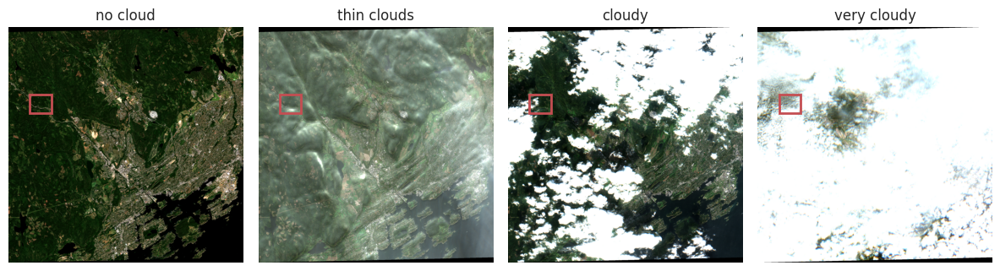

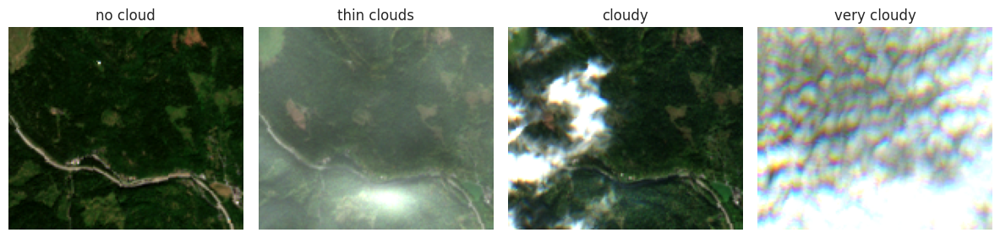

In [105]:
showRGB(selected_result_dirs, conditions, islice=islice, jslice=jslice, draw_bbox=True)
showRGB(selected_result_dirs, conditions, islice=islice, jslice=jslice)

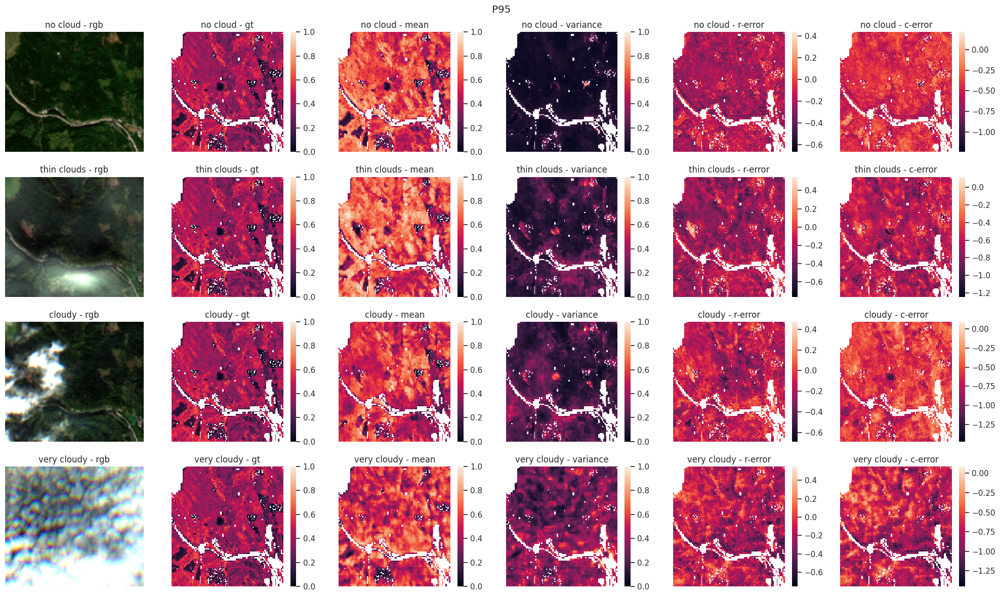

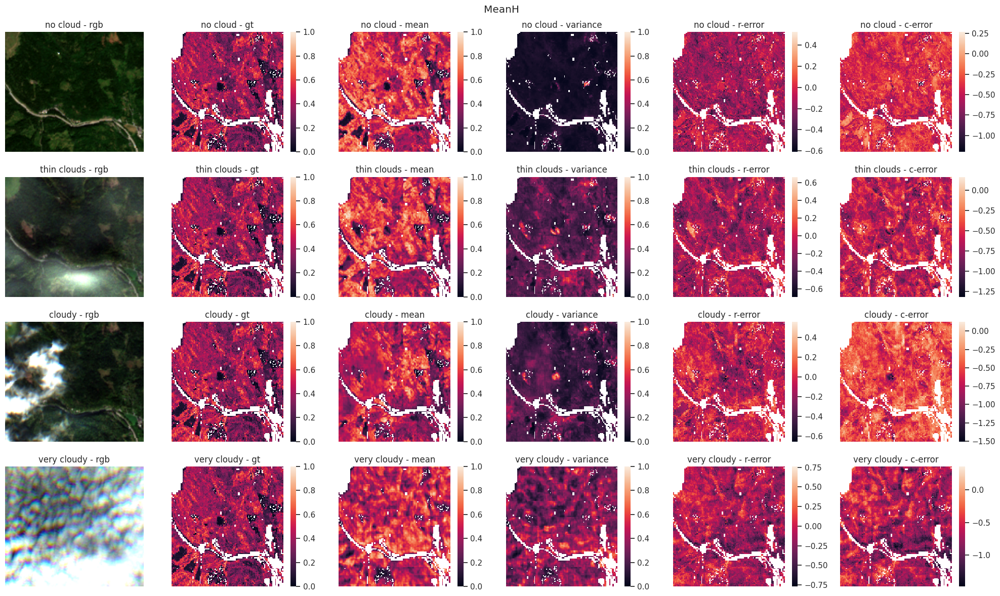

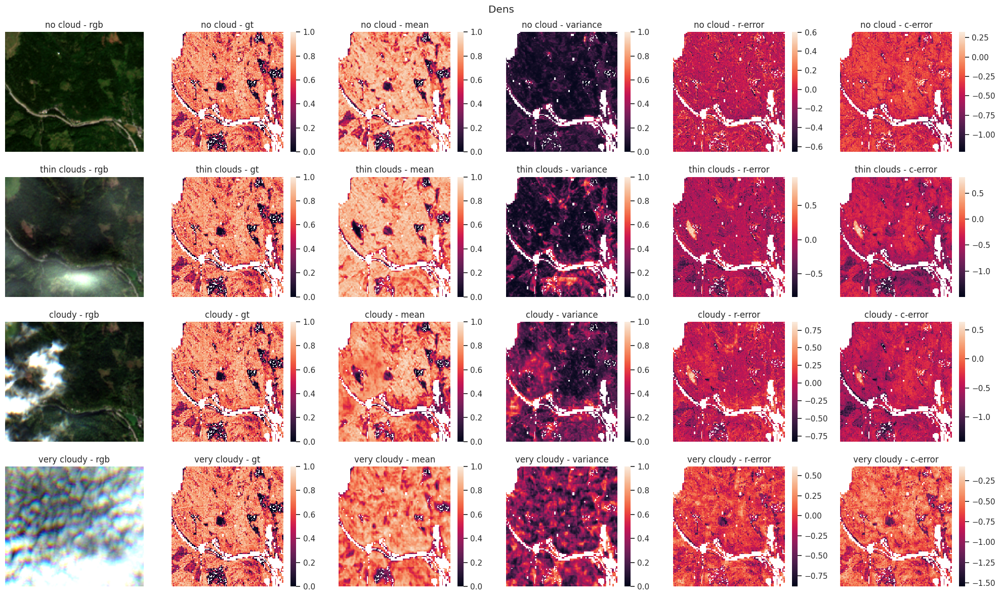

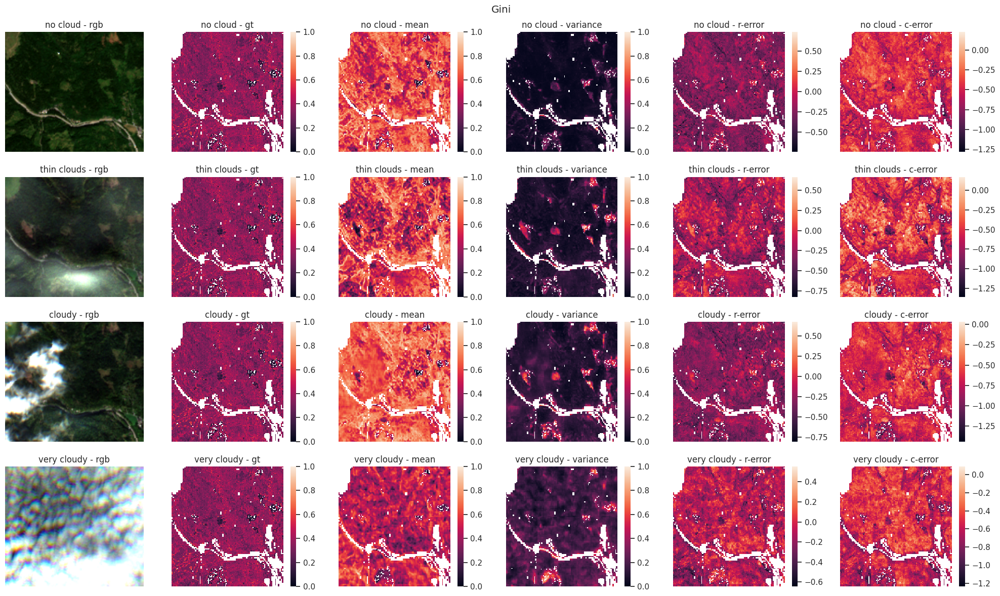

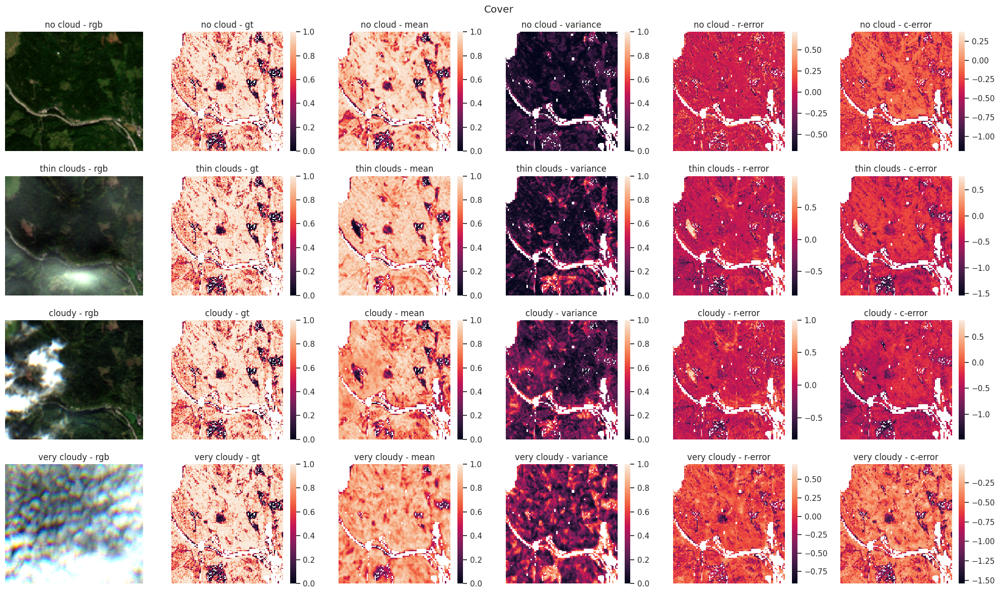

In [85]:
for i, variable_name in enumerate(VARIABLES):
    showVariableResults(
        selected_result_dirs, 
        conditions,
        i+1, 
        VARIABLES[i],
        islice=islice,
        jslice=jslice,
        normalize=True
    )

# Visual results

In [55]:
370+250

620

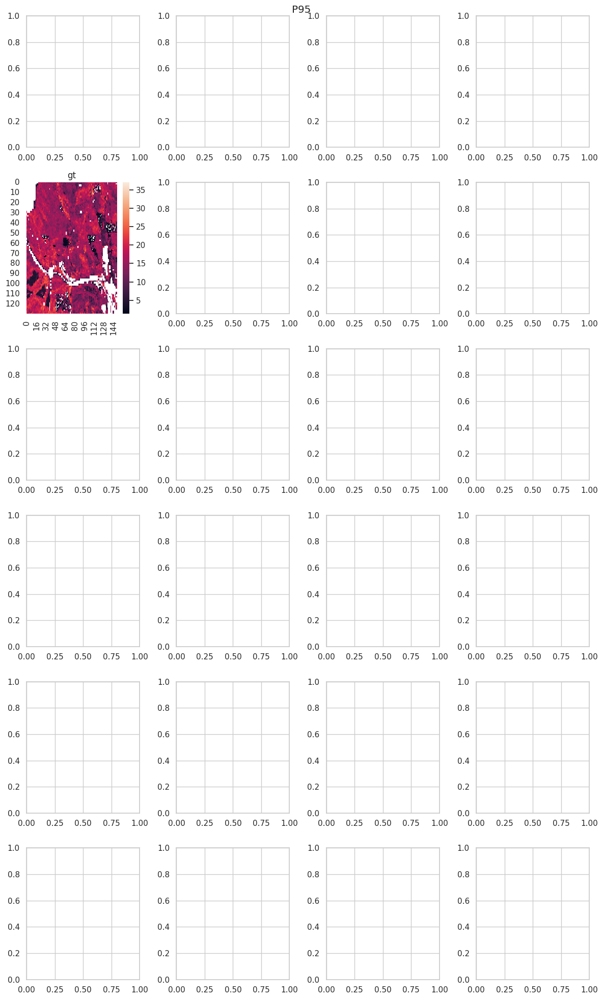

In [61]:
i = 0
showVariableResults(
    selected_result_dirs, 
    conditions,
    i+1, 
    VARIABLES[i],
    islice=slice(470, 600),
    jslice=slice(150, 300),
)

# Quantitative results

In [15]:
exp_vars = []
image_paths = []
for result_dir in selected_result_dirs:
    dir_name = result_dir.split("/")[-1]
    img_path = list(Path(os.path.join(S2REPRDIR, dir_name, "1023")).glob("*.tif"))[0]
    with rasterio.open(img_path) as f:
        data = f.read(f.count).astype("float")
        exp_vars.append(data.mean())
visualizer = ExperimentVisualizer.from_paths(
    selected_result_dirs,
    "avg_cloud_prob",
    exp_vars,
    VARIABLES,
    fig_ncols=5
)

In [16]:
exp_vars

[0.29036938933942175, 5.250399422674503, 31.448865033914917, 62.6135564388117]

In [17]:
# Sample size
data = {visualizer.exp_var_name: [], "count": []}
for i, rcu in enumerate(visualizer.rcus):
    count = np.nansum(rcu.histogram[0,0])
    data[visualizer.exp_var_name].append(visualizer.exp_vars[i])
    data["count"].append(count)
pd.DataFrame(data).sort_values(by=["avg_cloud_prob"])

,avg_cloud_prob,count
0,0.290369,335810.0
1,5.250399,335810.0
2,31.448865,335810.0
3,62.613556,335810.0


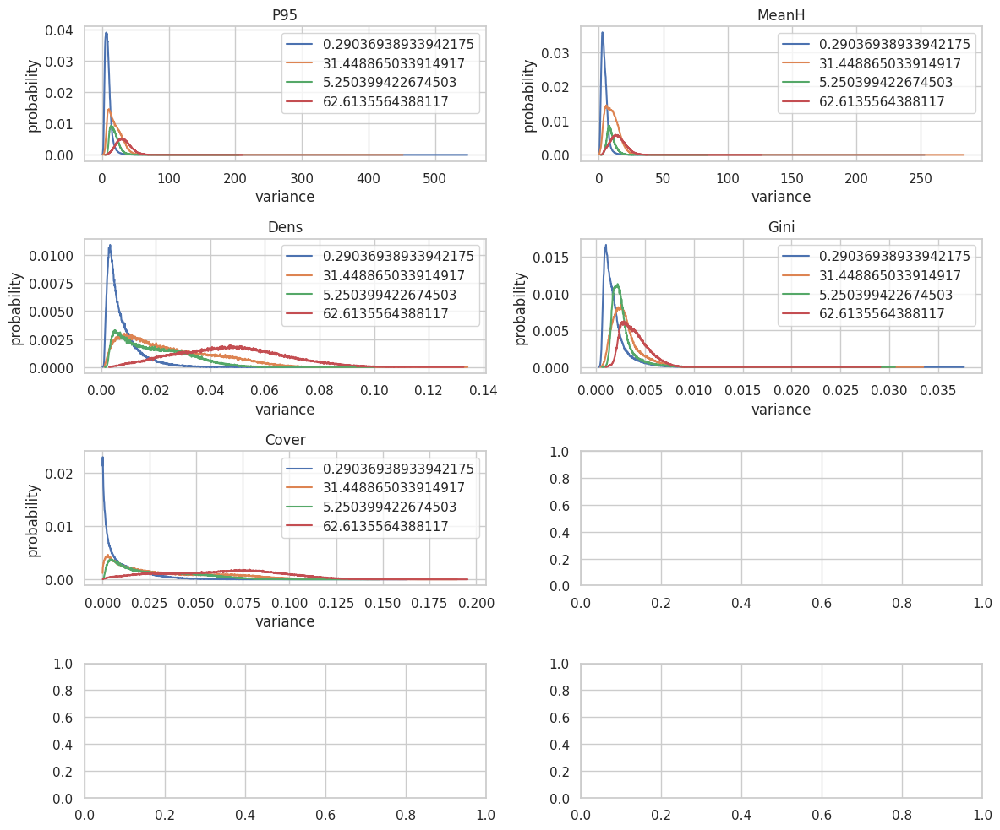

In [18]:
# Histogram: we expect less low variance estimates when the cloud proba increases
visualizer.histogram_plot(log=False)
plt.tight_layout()
plt.show()

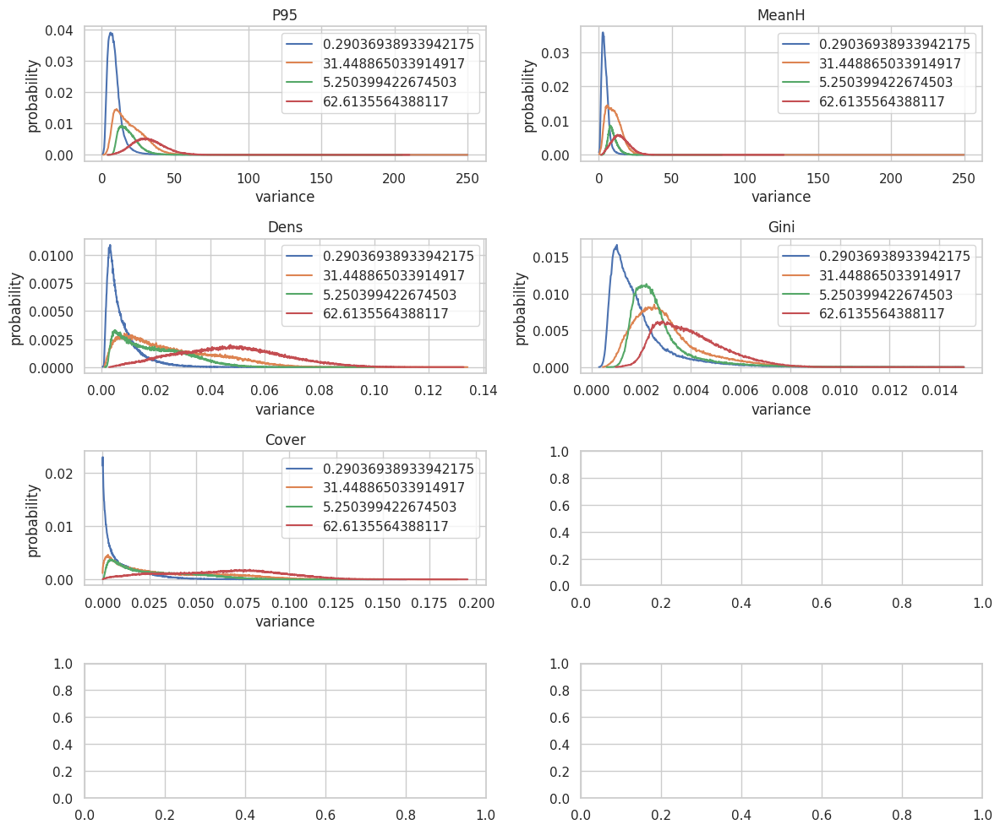

In [19]:
# Trimmed histogram
visualizer.histogram_plot(hi_bound=[250, 250, 0.14, 0.015, 0.25], log=False)
plt.tight_layout()
plt.show()

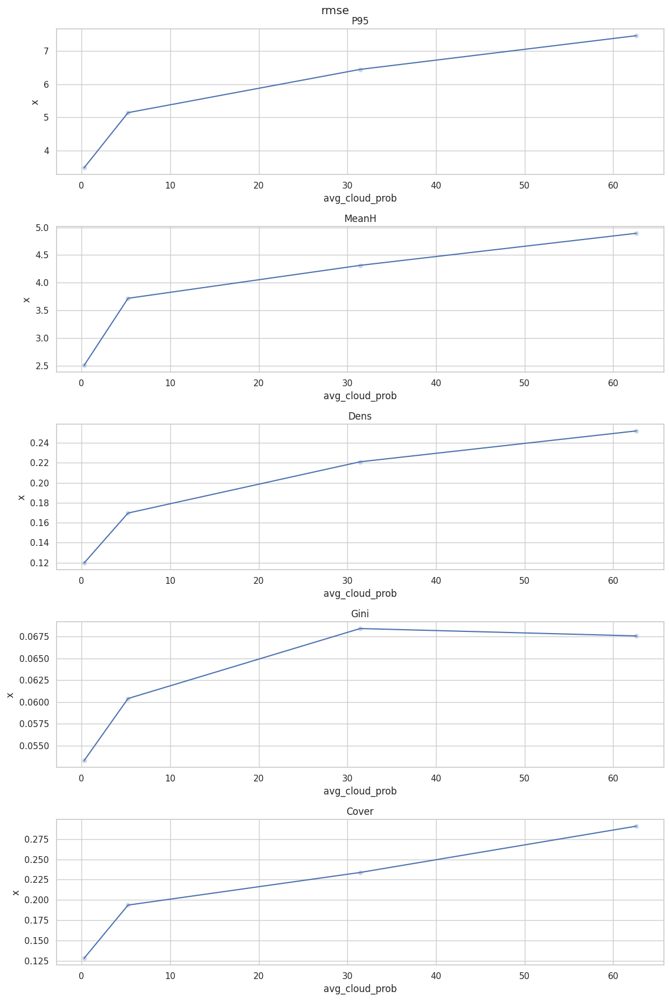

In [31]:
# rmse (min): Should increase as the data shift to unseen territories
axs = visualizer.metric_plot("rmse", "agg")
plt.tight_layout()
plt.show()

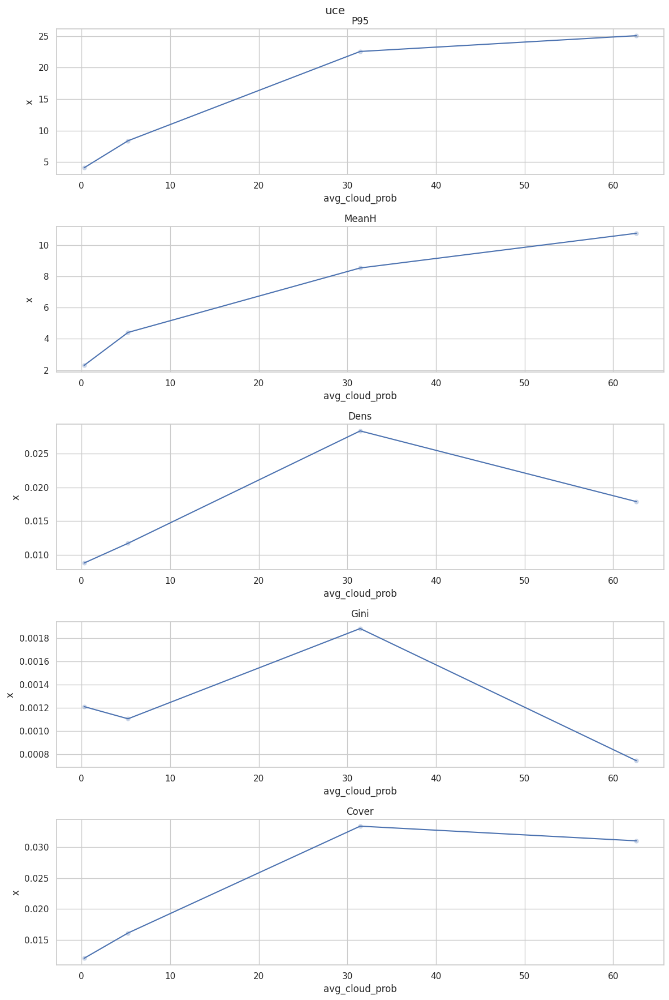

In [32]:
# uce (min): should stay constant if calibration is consistent
axs = visualizer.metric_plot("uce", "agg")
plt.tight_layout()
plt.show()

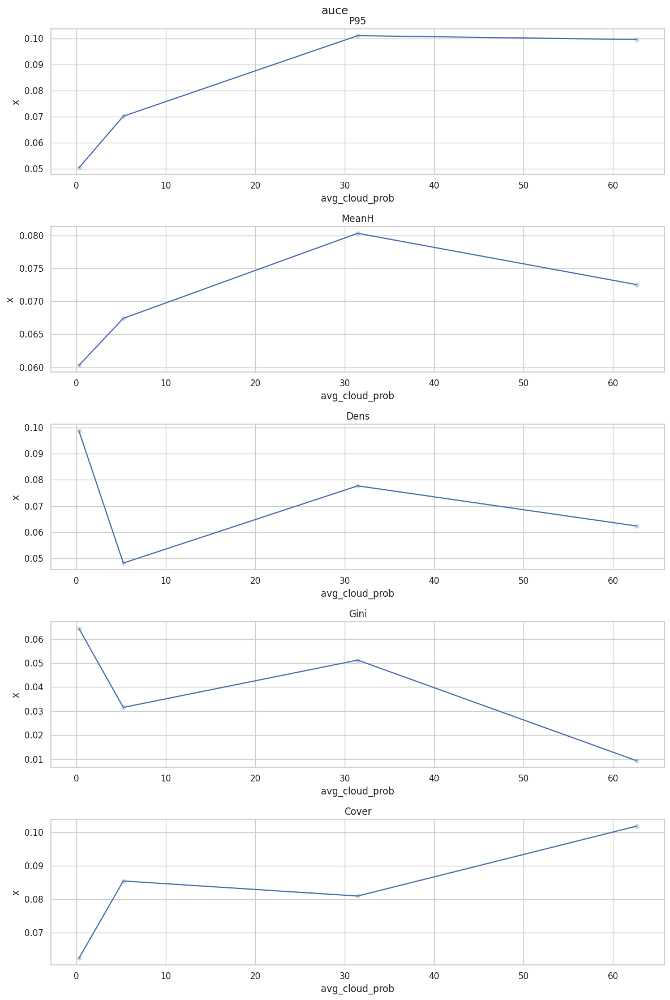

In [33]:
# auce (min): should stay constant if calibration is consistent
axs = visualizer.metric_plot("auce", "agg")
plt.tight_layout()
plt.show()

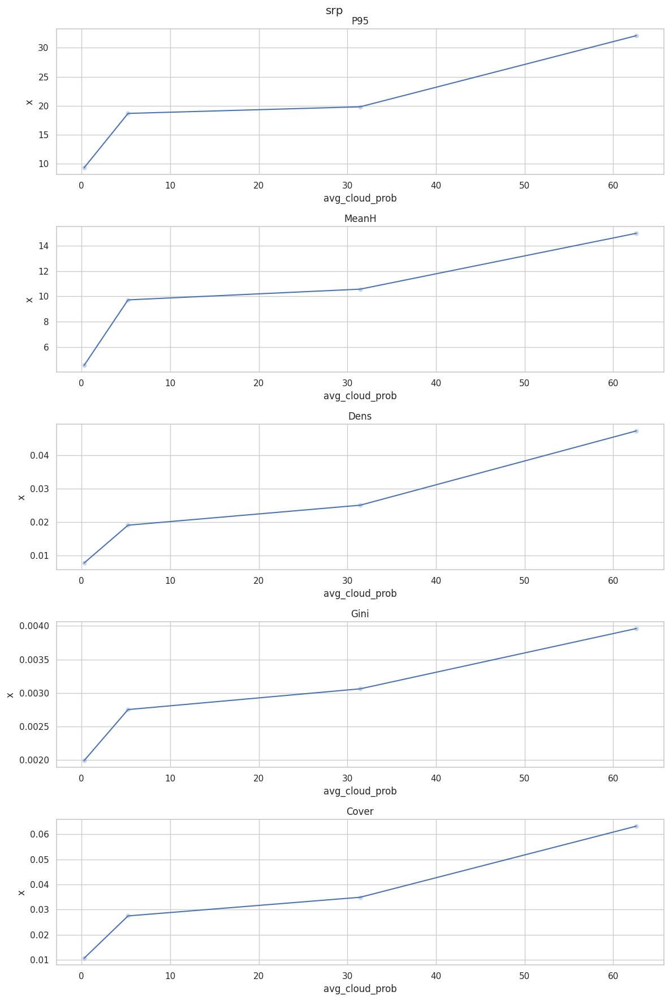

In [34]:
# srp (min): Should increase as the model should be less confident, i.e. produce higher mean variance estimates
axs = visualizer.metric_plot("srp", "agg")
plt.tight_layout()
plt.show()

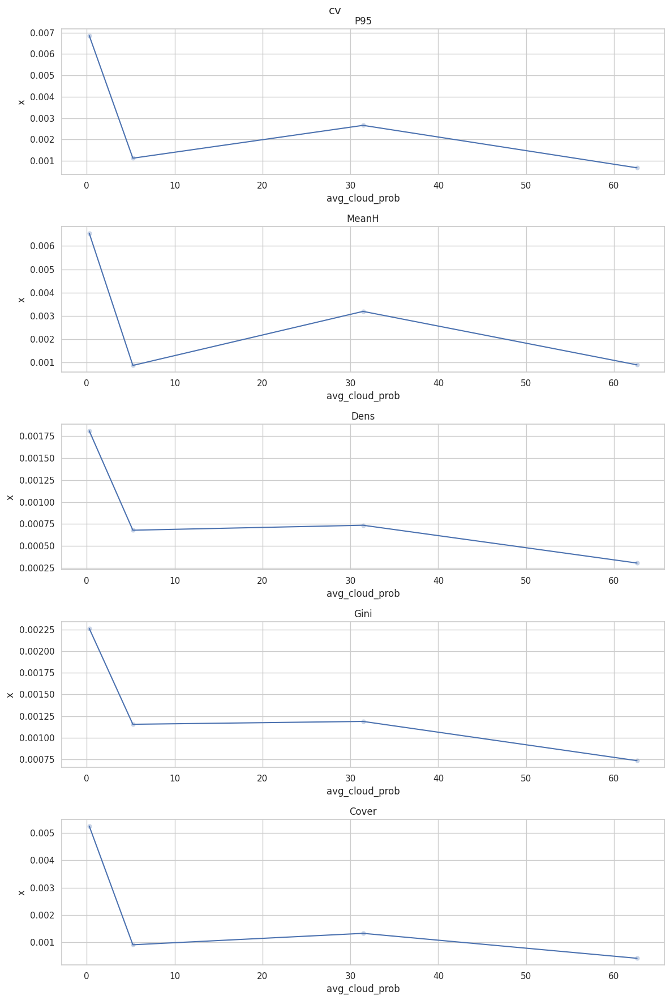

In [35]:
# cv (max): As the variance estimates distribution is heavy-tailed, we expect Cv to increase 
axs = visualizer.metric_plot("cv", "agg")
plt.tight_layout()
plt.show()

/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  

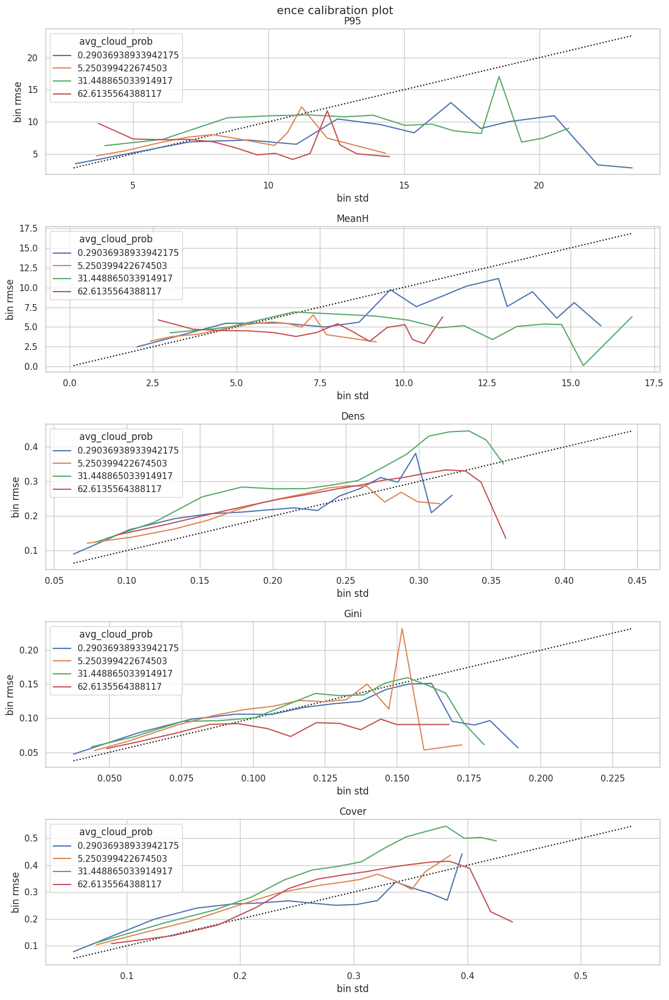

In [36]:
visualizer.calibration_plot("ence", log_bins=False)
plt.tight_layout()
plt.show()

/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  

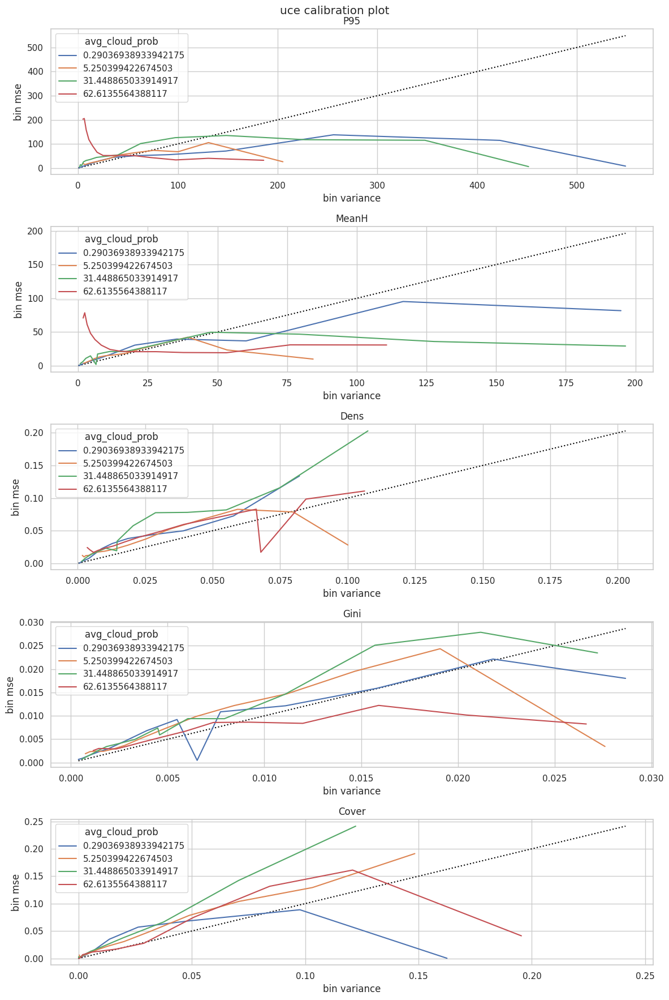

In [37]:
visualizer.calibration_plot("uce", log_bins=True)
plt.tight_layout()
plt.show()

/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  return np.nansum(values*counts, axis=axis, keepdims=keepdims)/np.nansum(counts, axis=axis, keepdims=keepdims)
/scratch/ewalt/pdm/rs-uncertainty/src/metrics.py:28: RuntimeWarning: invalid value encountered in true_divide
  

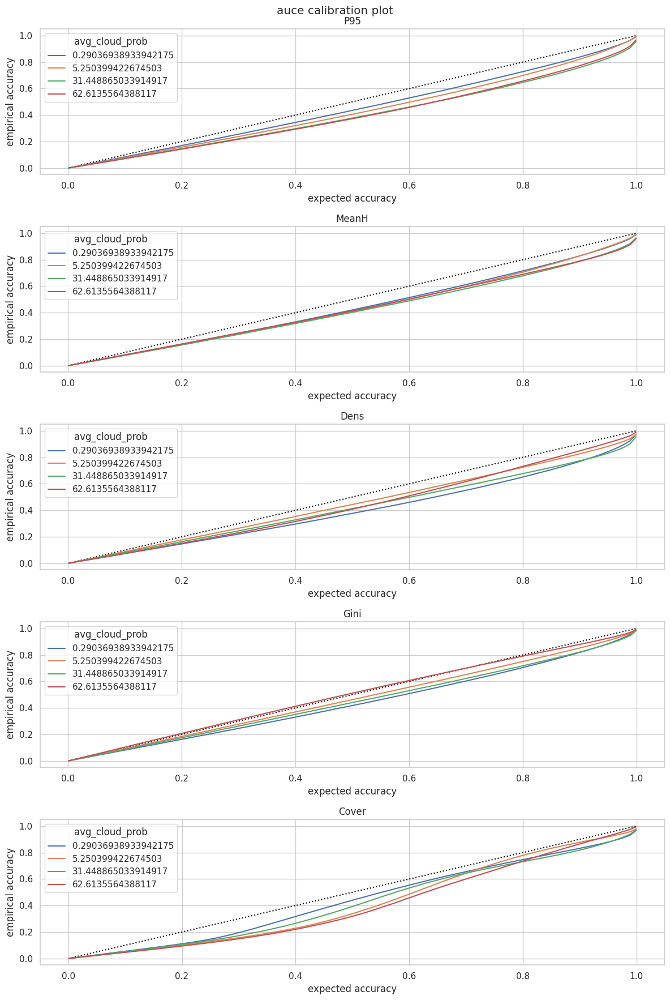

In [38]:
visualizer.calibration_plot("auce", log_bins=True)
plt.tight_layout()
plt.show()